## 9-3. 프로젝트 2: Object Detection

- 해당 코드는 텐서플로우 공식 홈페이지의 튜토리얼에서 제시된 코드를 활용.

In [1]:
!pip3 install tensorflow-estimator==2.6.0 # 라이브러리를 불러옴.

In [2]:
# Tensorflow와 Tensoflow Hub에 있는 이미 학습된 모델을 활용하기 위한 모듈 
import tensorflow as tf
import tensorflow_hub as hub

# 이미지를 다운로드하는 데에 사용하는 모듈
import matplotlib.pyplot as plt
import tempfile 
from six.moves.urllib.request import urlopen
from six import BytesIO

# 이미지에 선과 폰트를 넣기 위한 모듈
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

import time # Detection하는 데에 소요된 시간을 점검하기 위한 모듈

In [3]:
def display_image(image): # 이미지를 시각화하는 함수를 만듦
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)

In [4]:
 ### 원하는 이미지를 다운로드하고 정해진 가로, 세로 길이에 맞게 이미지를 resizing하는 함수를 만듬

In [5]:
def download_and_resize_image(url, new_width=256, new_height=256, display=False): 
  
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)  # 이미지 읽기
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS) # 이미지 조정
  pil_image_rgb = pil_image.convert("RGB") #RBG로 변환
  pil_image_rgb.save(filename, format="JPEG", quality=90) # 이미지 저장
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename

In [6]:
# Bounding Box를 만드는 함수를 만듬
def draw_bounding_box_on_image(image, 
                               ymin, xmin, ymax, xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)

# BBox 테두리 그리기
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin

###  이미지 위에 class 이름과 score를 나타내는 함수도 만듬

In [7]:
# BBox 그리기
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1): 
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

# BBox 그리기 적용
  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])  # 박스 좌표값
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

- 이미지를 불러옴. 원하는 이미지를 불러오고, 가로와 세로를 변경해 보는 실험을 진행.

Image downloaded to /tmp/tmpb2suyqyg.jpg.


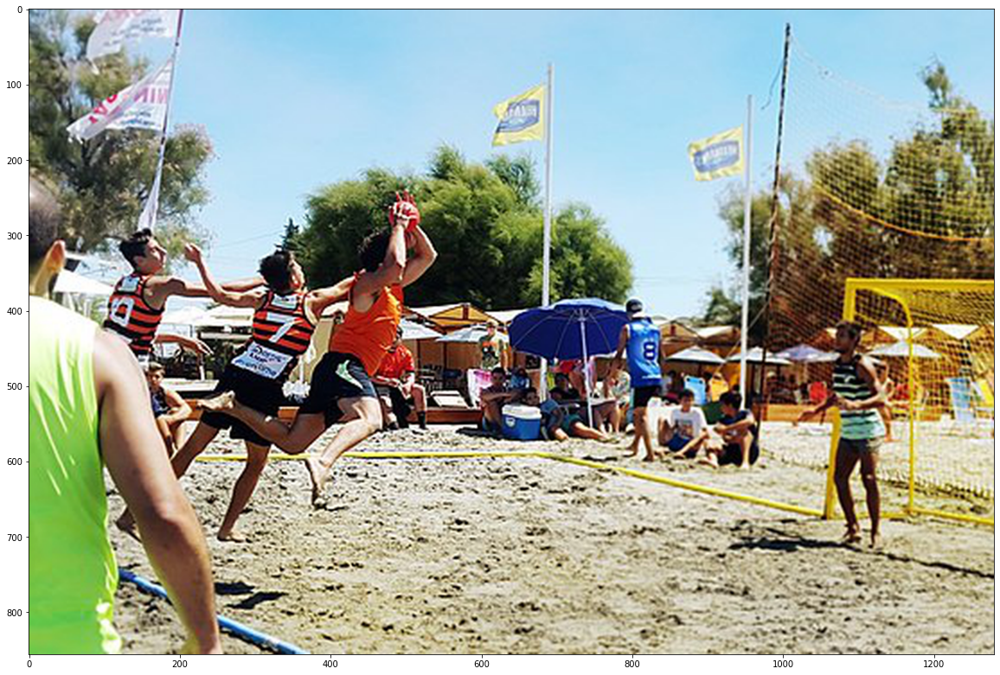

In [8]:
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해보자

- tfhub에서 사전 학습된(Pre-trained) InceptionResnet 모델을 사용한 Faster RCNN 모델을 불러옴.

In [9]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"  

detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [10]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

In [11]:
def run_detector(detector, path): # Detector를 실행하는 함수를 만듬
  img = load_img(path) 

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

# 소요시간 측정
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

# 이미지 추론 개수와 추론 시간 출력
  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

# 이미지 내 박스로 entity, scores를 추가하여 출력
  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

Found 100 objects.
Inference time:  42.45088720321655


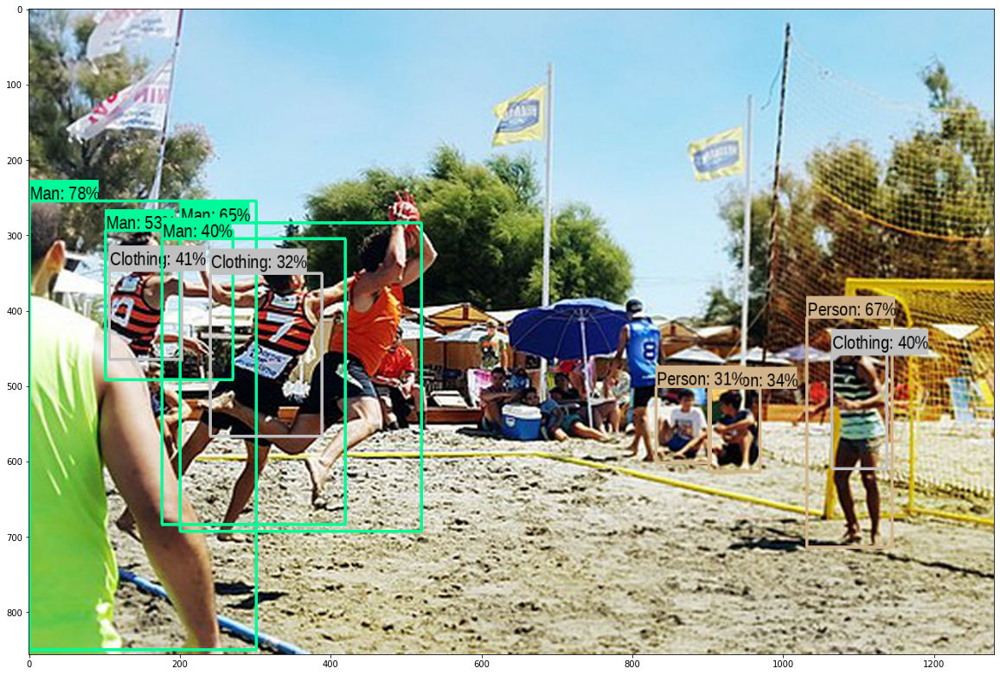

In [12]:
run_detector(detector, downloaded_image_path) # detector를 실행

## 2-1. 다른 이미지 테스트해보기

  원하는 이미지를 불러와 결과를 확인

Image downloaded to /tmp/tmp1v9ulehy.jpg.


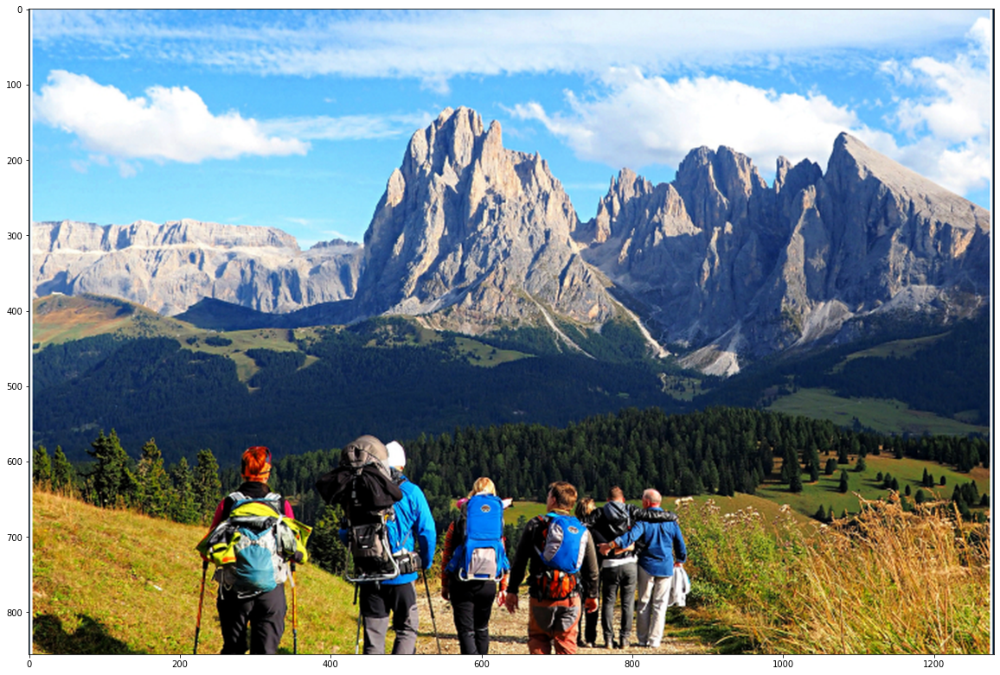

In [14]:
image_url = "https://www.ktown1st.com/uploads/images/smarteditor/2018/09/14/d4cec778202ed868654c81c65ce582a7.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True) 

Found 100 objects.
Inference time:  1.3185675144195557


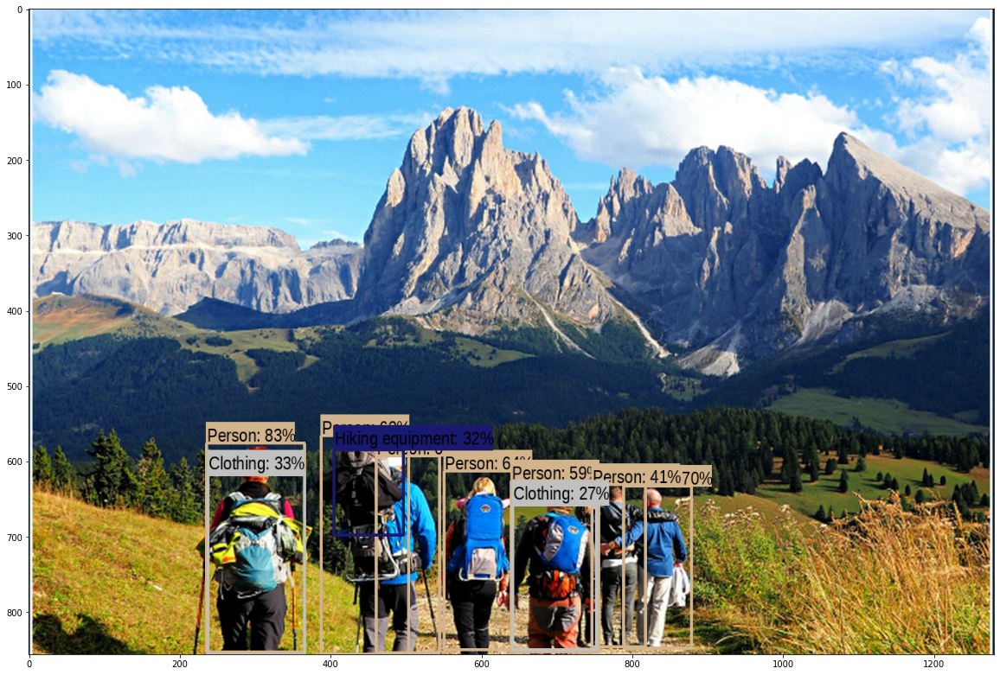

In [15]:
run_detector(detector, downloaded_image_path) # detector를 실행

Image downloaded to /tmp/tmp5lofxwjx.jpg.


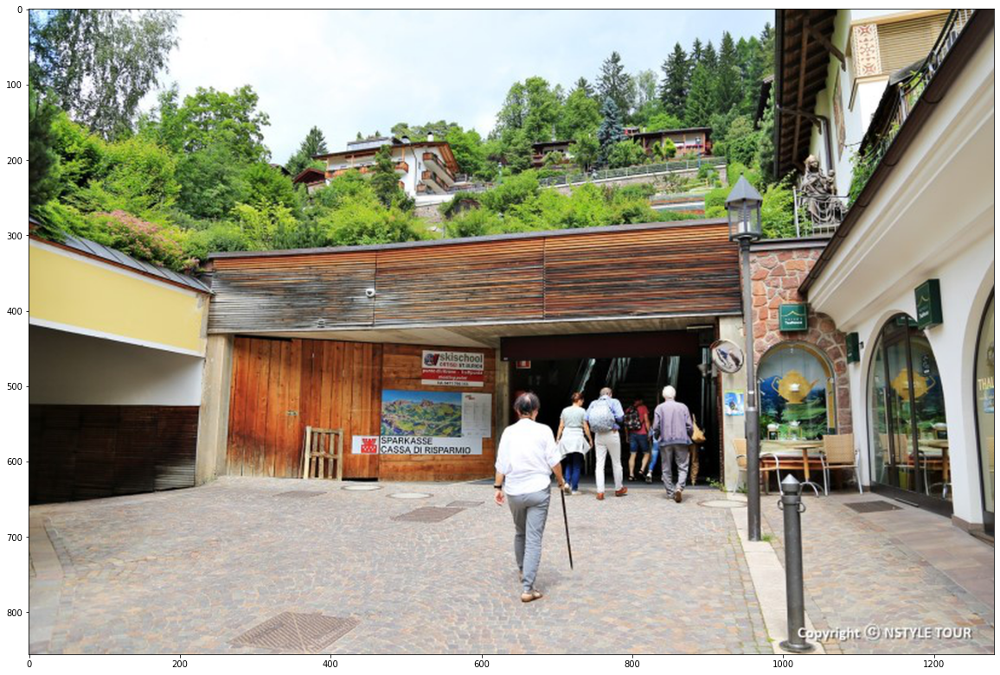

In [16]:
image_url = "https://mblogthumb-phinf.pstatic.net/MjAxOTA5MjdfMTYy/MDAxNTY5NTgxNTUyMTE1.CCEGiP8Leo9V5-yajpbAj3_Li34cqZvmeWIrls_BVOQg.d6e9cnQaoZy-X1bKNtUnqzUKFQrekHvRN4Sd2U1wujgg.JPEG.nstyle_tour/IMG_3031.JPG?type=w800"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)    

Found 100 objects.
Inference time:  1.322847604751587


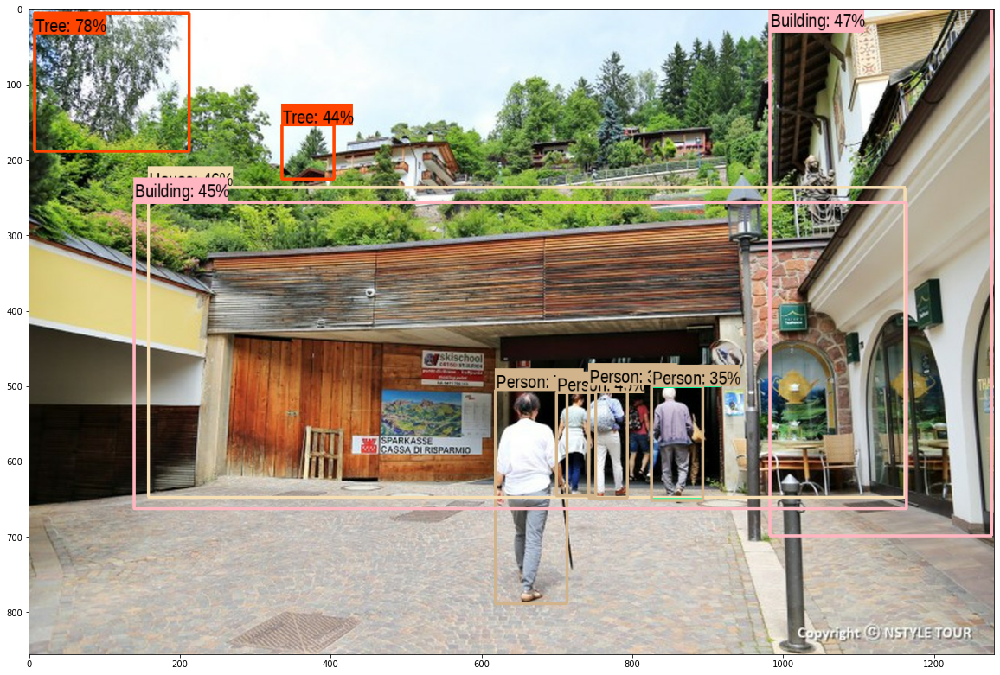

In [17]:
run_detector(detector, downloaded_image_path) # detector를 실행

## 2-2. 다양한 pre-trained model 테스트해보기

- Faster RCNN 외에도 Object Detection을 할 수 있는 다양한 사전 학습 모델이 있다. tfhub을 탐색하여 사용할 수 있는 1개 이상의 모델을 불러와 결과를 테스트해보고, 그 결과를 비교해 보세요.

In [18]:
module_handle = "https://tfhub.dev/google/openimages_v4/ssd/mobilenet_v2/1"  

detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


Image downloaded to /tmp/tmpv_wxblwz.jpg.


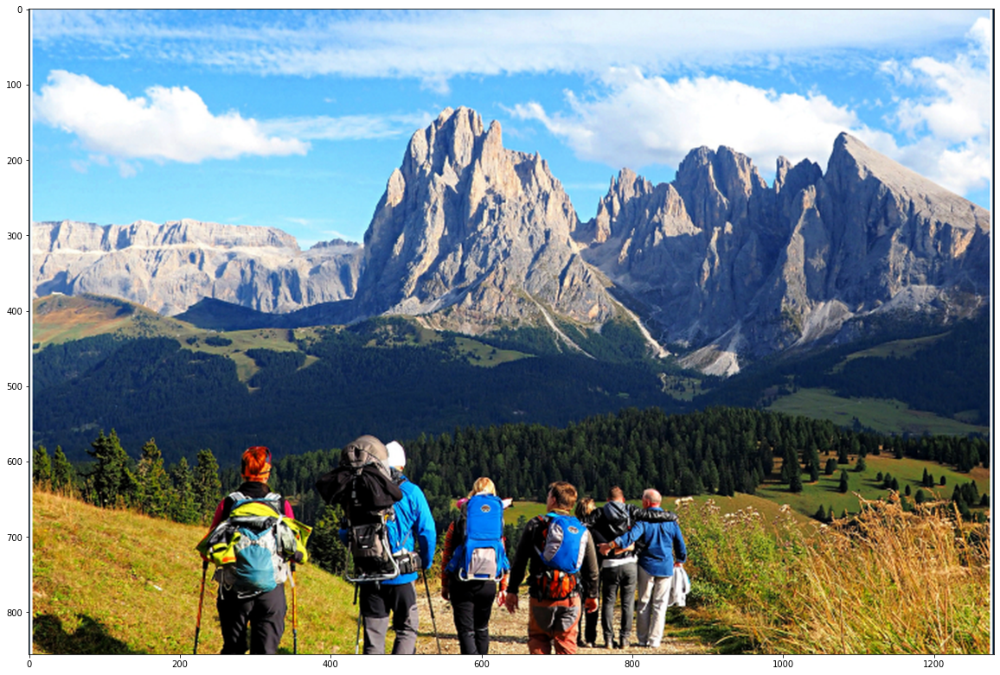

In [19]:
image_url = "https://www.ktown1st.com/uploads/images/smarteditor/2018/09/14/d4cec778202ed868654c81c65ce582a7.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True) 

Found 100 objects.
Inference time:  7.143957138061523


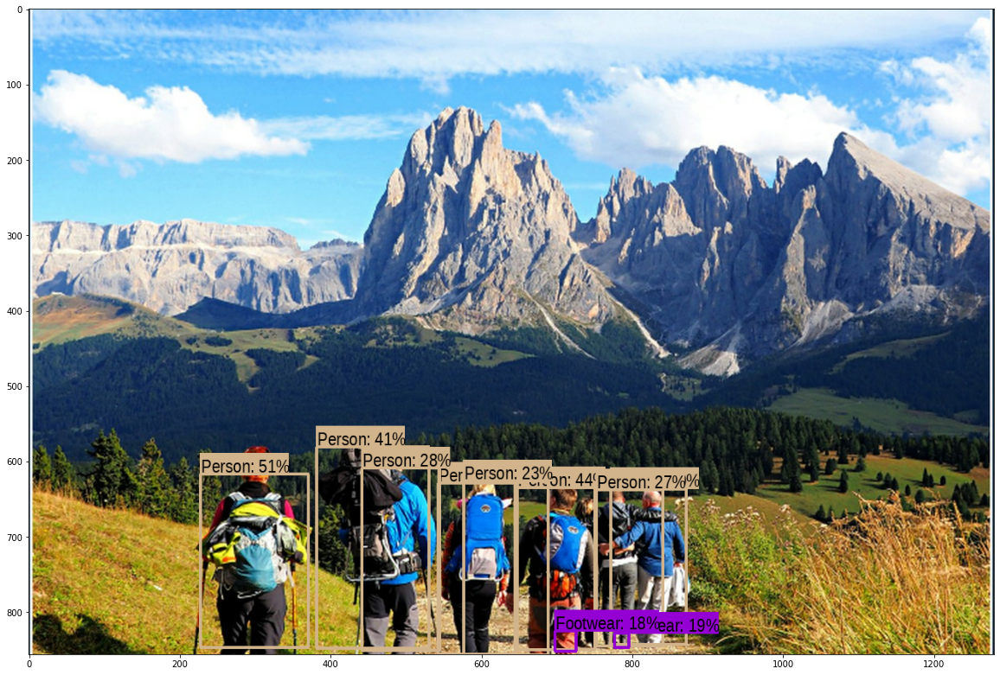

In [20]:
run_detector(detector, downloaded_image_path) # detector를 실행

Image downloaded to /tmp/tmphehumbwd.jpg.


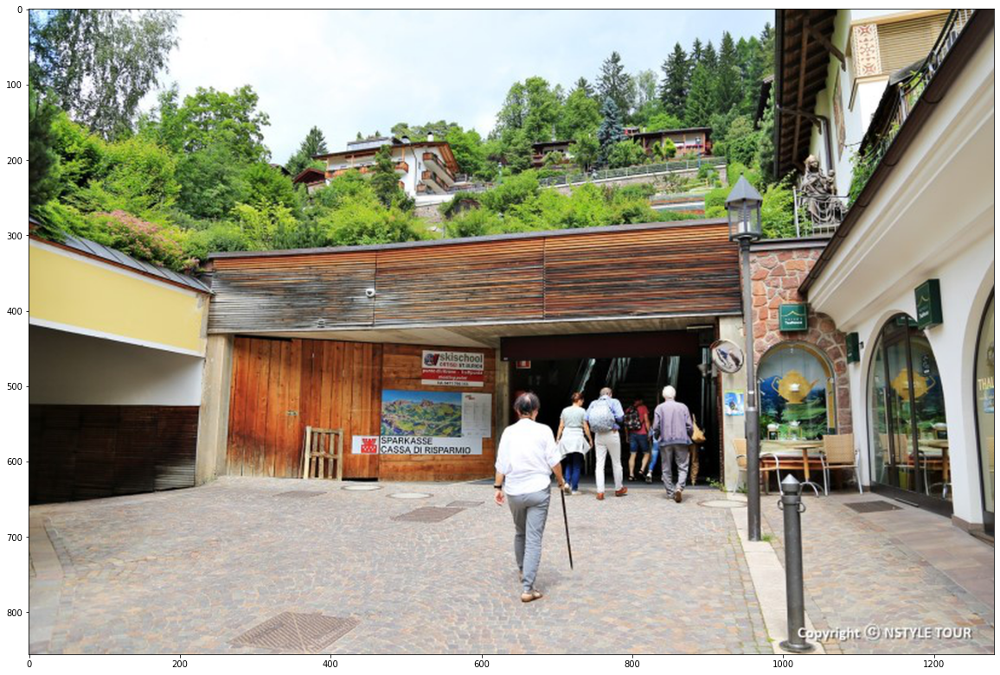

In [21]:
image_url = "https://mblogthumb-phinf.pstatic.net/MjAxOTA5MjdfMTYy/MDAxNTY5NTgxNTUyMTE1.CCEGiP8Leo9V5-yajpbAj3_Li34cqZvmeWIrls_BVOQg.d6e9cnQaoZy-X1bKNtUnqzUKFQrekHvRN4Sd2U1wujgg.JPEG.nstyle_tour/IMG_3031.JPG?type=w800"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)    

Found 100 objects.
Inference time:  0.2623262405395508


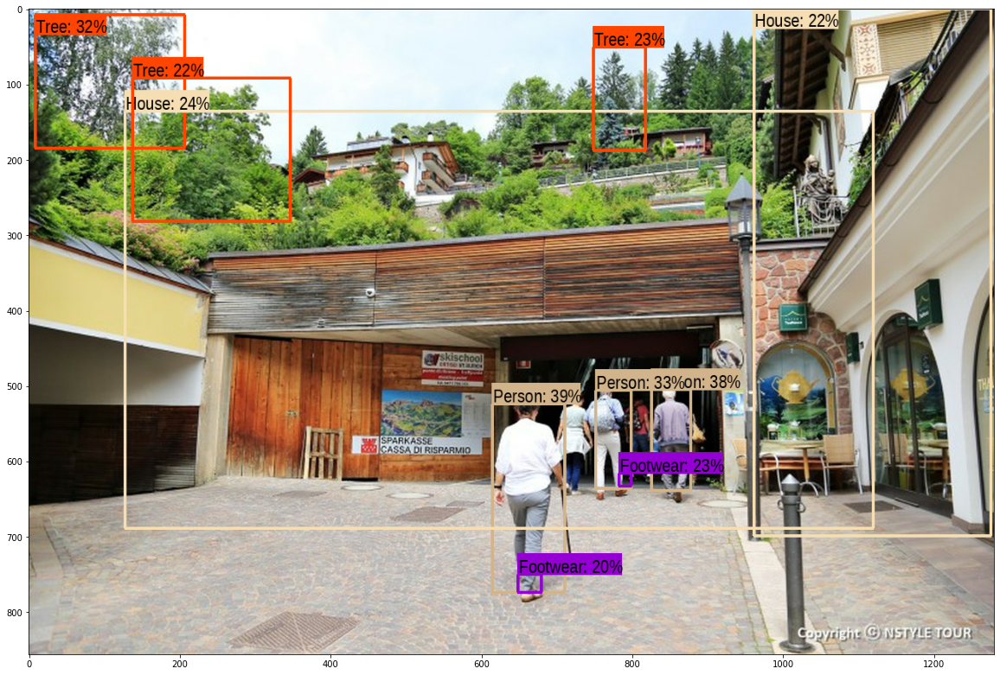

In [22]:
run_detector(detector, downloaded_image_path) # detector를 실행

## inception_resnet_v2/1 과 mobilenet_v2 의 인식 비교 

- inception_resnet_v2/1 : 첫 image에선 사람 6명, 옷 2개, 등산장비 1개 인식, 두번째 image에선  사람 5명, 나무 2개, 집 2개 인식


- mobilenet_v2 : 첫 image에선 사람 7명, 신발 2개 인식, 두번째 image에선  사람 3명, 신발 2개, 나무 3개, 집 2개  인식


- 두개의 식별기능은 큰차이가 없었다  

## Reference

- https://velog.io/@ym980118/%EB%94%A5%EB%9F%AC%EB%8B%9D-Callback 


- https://foxtrotin.tistory.com/535 steps_per_epoch 


- https://velog.io/@whiteamericano/R-CNN-%EC%9D%84-%EC%95%8C%EC%95%84%EB%B3%B4%EC%9E%90 RCNN 


- https://inhovation97.tistory.com/32 learning Rate


- https://seongkyun.github.io/papers/2019/01/06/Object_detection/ RCNN,  fast  RCNN, faster RCNN,  차이


## 회고 

- 학습률을 0,002에서 0.0001로 낮췄더니 accuracy가 62% 에서 70%까지 올라감.

- epoch 횟수를 늘리는것보다 과대적합 위치를 찾아내는것 필요. 